# Fruits and Vegetables Image Classification

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os   # Dosya islemleri
import warnings  

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import matplotlib.image as mpimg

In [14]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
warnings.filterwarnings("ignore")      # Uyarı satırlarını gosterme  

#### Dataset halihazırda test,train ve validation olarak ayrıldığı için train_test_split kullanılmadı.
#### Her bir resmin boyutu (128,128) olacak şekilde ayarlandı.

In [30]:
train_dir = '/kaggle/input/fruit-and-vegetable-image-recognition/train'
val_dir   = "/kaggle/input/fruit-and-vegetable-image-recognition/validation"
test_dir  = "/kaggle/input/fruit-and-vegetable-image-recognition/test"

# Data augmentation (eğitim için küçük değişiklikler)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)


train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred', 
    label_mode='categorical',
    image_size=(128, 128),
    batch_size=32)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels="inferred",
    label_mode="categorical",
    image_size=(128,128),
    batch_size=32
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels="inferred",
    label_mode="categorical",
    image_size=(128,128),
    batch_size=32
)

class_names = train_ds.class_names
print("Class Names:")
print(class_names)

Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.
Found 359 files belonging to 36 classes.
Class Names:
['apple', 'banana', 'beetroot', 'bell pepper', 'cabbage', 'capsicum', 'carrot', 'cauliflower', 'chilli pepper', 'corn', 'cucumber', 'eggplant', 'garlic', 'ginger', 'grapes', 'jalepeno', 'kiwi', 'lemon', 'lettuce', 'mango', 'onion', 'orange', 'paprika', 'pear', 'peas', 'pineapple', 'pomegranate', 'potato', 'raddish', 'soy beans', 'spinach', 'sweetcorn', 'sweetpotato', 'tomato', 'turnip', 'watermelon']


#### Aşağıdaki kod bloğu yardımı ile her bir sınıfın okunabilen ilk resim dosyasını ekrana bastırıyoruz.

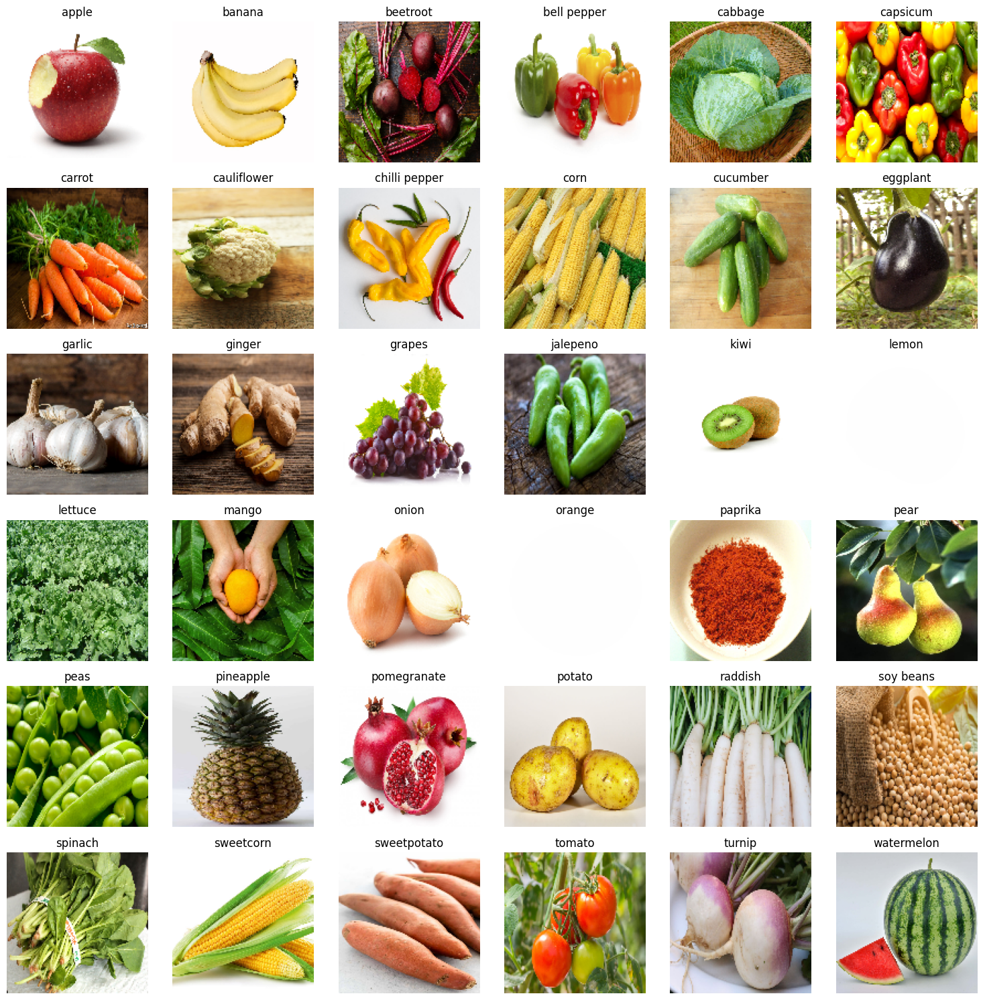

In [24]:
folders = sorted(os.listdir(train_dir)) # Dosyaları alfabetik sırala

num_classes = len(folders) # Kaç sınıf var

plt.figure(figsize=(15, 15))

for i, folder in enumerate(folders):
    folder_path = os.path.join(train_dir, folder)
    
    if os.path.isdir(folder_path):
        # Dosyaları sırala
        file_list = sorted(os.listdir(folder_path))
        
        if len(file_list) > 0:
            file_name = file_list[0] # İlk dosya
            img_path = os.path.join(folder_path, file_name)
            
            # Resmi oku
            img = mpimg.imread(img_path)
            img = tf.image.resize(img, (128,128)).numpy().astype("uint8")
            
            # Subplot'a koy
            plt.subplot(6, 6, i+1)
            plt.imshow(img)
            plt.title(folder)
            plt.axis("off")

plt.tight_layout()
plt.show()


#### Datasette hatalı etiketlenmiş veri olup olmadığını kontrol edebilmek için random kütüphanesi yardımı ile rastgele fotoğraflar basıyoruz. Hatalı veri görünmüyor.

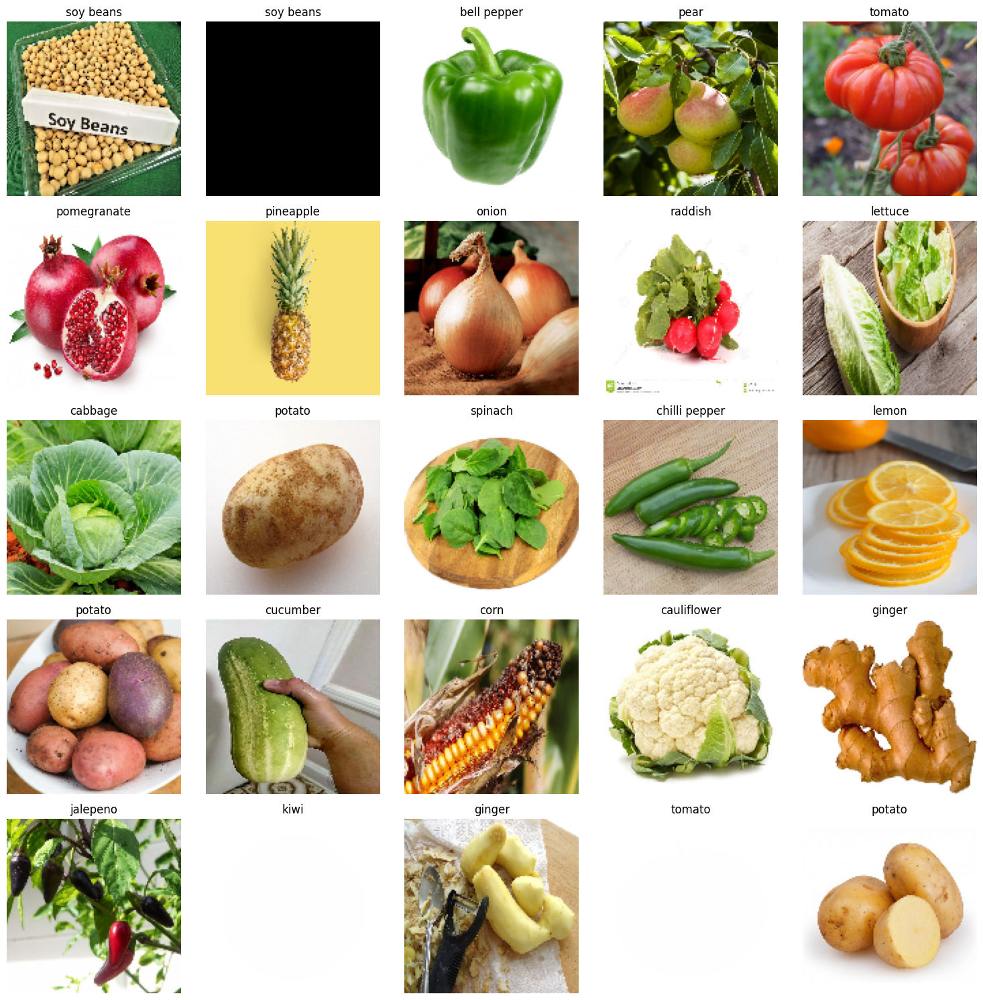

In [25]:
all_images = []
all_labels = []

# Tüm datasetten bütün resimleri ve etiketlerini topla
for folder in os.listdir(train_dir):
    folder_path = os.path.join(train_dir, folder)
    if os.path.isdir(folder_path):
        files = sorted(os.listdir(folder_path))
        for file in files:
            file_path = os.path.join(folder_path, file)
            try:
                img = mpimg.imread(file_path)
                img = tf.image.resize(img, (128,128)).numpy().astype("uint8")
                all_images.append(img)
                all_labels.append(folder)
            except:
                continue

# Rastgele 25 örnek seç
indices = random.sample(range(len(all_images)), 25)

plt.figure(figsize=(15, 15))
for i, idx in enumerate(indices):
    plt.subplot(5, 5, i+1)
    plt.imshow(all_images[idx])
    plt.title(all_labels[idx])
    plt.axis("off")

plt.tight_layout()
plt.show()


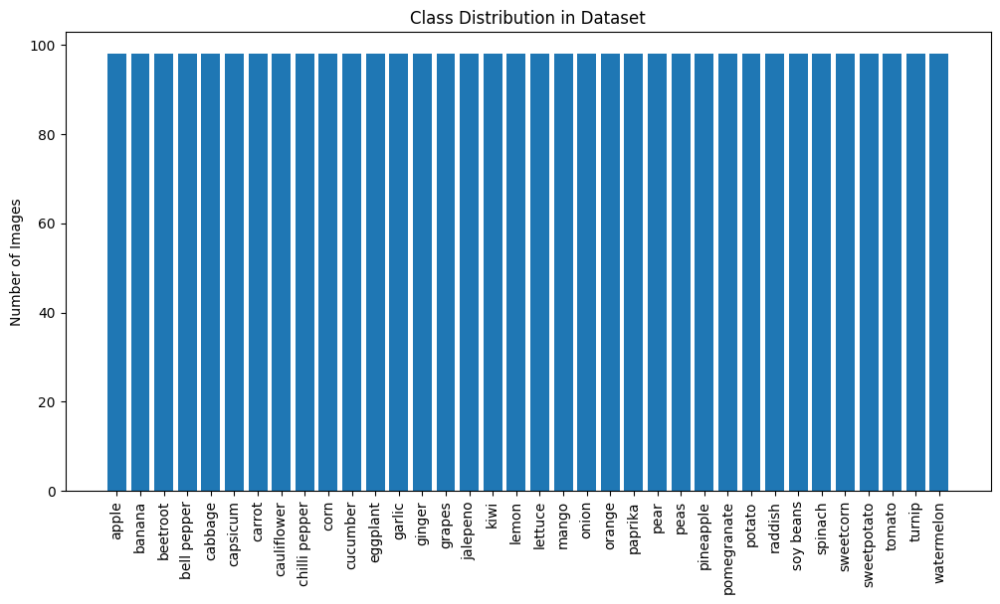

In [11]:
class_counts = {}

for folder in sorted(os.listdir(train_dir)):
    if os.path.isdir(folder_path):
        class_counts[folder] = len(os.listdir(folder_path))

# Tabloya çevir
df_counts = pd.DataFrame(list(class_counts.items()), columns=["Class", "Image_Count"])

plt.figure(figsize=(12,6))
plt.bar(df_counts["Class"], df_counts["Image_Count"])
plt.xticks(rotation=90)
plt.ylabel("Number of Images")
plt.title("Class Distribution in Dataset")
plt.show()

#### Yukarıdaki grafiğe bakarak train dosyasındaki her bir sınıfın eşit sayıda veriye sahip olduğunu görebiliriz. Bundan yola çıkarak verisetinin düzenli olduğu yorumunu yapabiliriz.

## MODEL EĞİTİMİ

In [22]:
from tensorflow.keras import layers, models

In [31]:
def cnn(optimizer="adam", filters=32, kernel_size=3, dropout_rate=0.5):
    model = models.Sequential([
        layers.Rescaling(1./255, input_shape=(128,128,3)),  # normalize
        
        layers.Conv2D(filters, (kernel_size, kernel_size), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        
        layers.Conv2D(filters*2, (kernel_size, kernel_size), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        
        layers.Conv2D(filters*4, (kernel_size, kernel_size), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(dropout_rate),
        layers.Dense(len(class_names), activation='softmax')
    ])
    
    model.compile(optimizer=optimizer,
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])
    return model


In [32]:
model = cnn()
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 36)             │         9,252 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,525,284 (24.89 MB)

 Trainable params: 6,525,284 (24.89 MB)

 Non-trainable params: 0 (0.00 B)

In [33]:
history = model.fit(
    train_ds,
    epochs=15,
    validation_data=val_ds
)


Epoch 1/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.0397 - loss: 3.6615 - val_accuracy: 0.1425 - val_loss: 3.0907
Epoch 2/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 93s 941ms/step - accuracy: 0.1325 - loss: 3.1324 - val_accuracy: 0.2877 - val_loss: 2.5274
Epoch 3/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 92s 928ms/step - accuracy: 0.1833 - loss: 2.8072 - val_accuracy: 0.4217 - val_loss: 2.1121
Epoch 4/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 92s 936ms/step - accuracy: 0.2544 - loss: 2.5426 - val_accuracy: 0.5100 - val_loss: 1.7965
Epoch 5/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 88s 892ms/step - accuracy: 0.3139 - loss: 2.3133 - val_accuracy: 0.5670 - val_loss: 1.5394
Epoch 6/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 139s 871ms/step - accuracy: 0.3462 - loss: 2.1748 - val_accuracy: 0.6638 - val_loss: 1.2113
Epoch 7/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 146s 898ms/step - accuracy: 0.4180 - loss: 1.9787 - val_accuracy: 0.7236 - val_loss: 1.1064
Epoch 8/15
98/98 ━━━━━━━━━━━━━━━━━━━━ 141s 898ms/step - accuracy: 0.4465 - loss: 1.7969 - val_acc

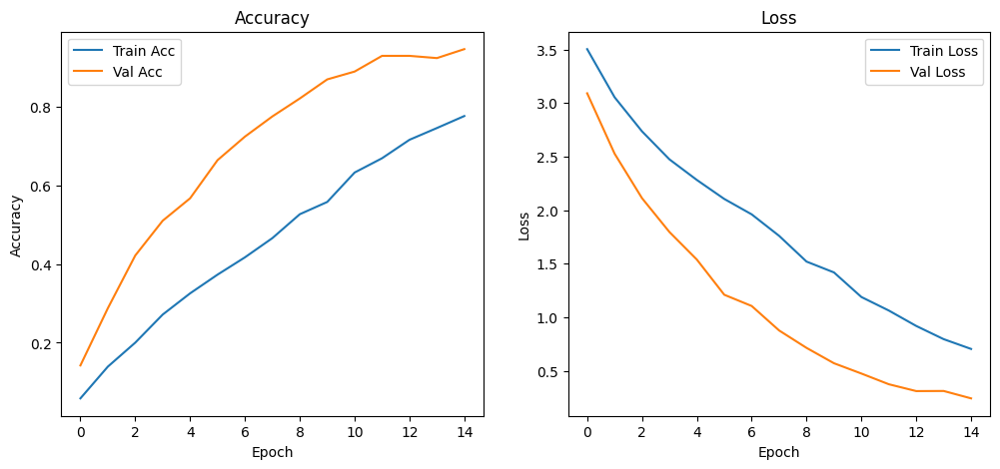

In [34]:
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history["accuracy"], label="Train Acc")
plt.plot(history.history["val_accuracy"], label="Val Acc")
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"], label="Val Loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()


In [35]:
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 563ms/step - accuracy: 0.9257 - loss: 0.2662
Test Loss: 0.2406
Test Accuracy: 0.9471


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


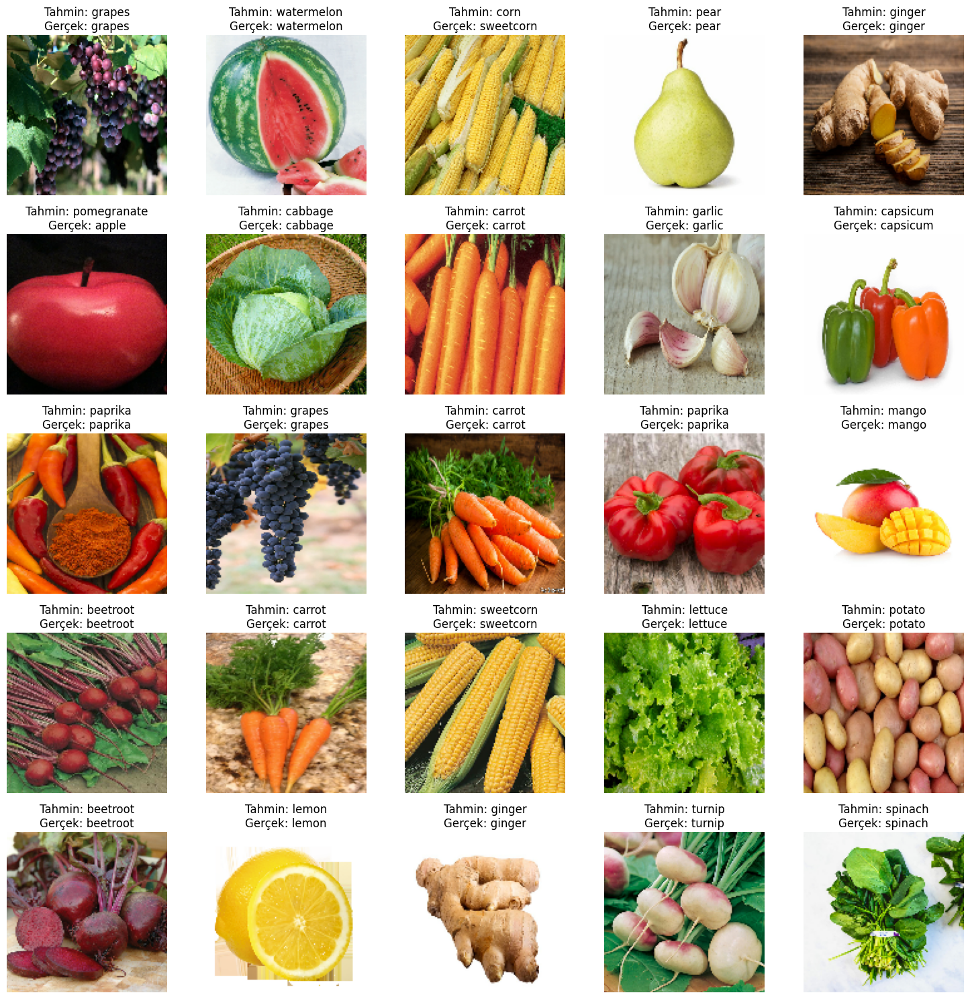

In [36]:
class_names = train_ds.class_names

plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    preds = model.predict(images)
    preds = tf.argmax(preds, axis=1)
    true_labels = tf.argmax(labels, axis=1)

    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Tahmin: {class_names[preds[i]]}\nGerçek: {class_names[true_labels[i]]}")
        plt.axis("off")
plt.tight_layout()
plt.show()


<Figure size 4000x4000 with 0 Axes>

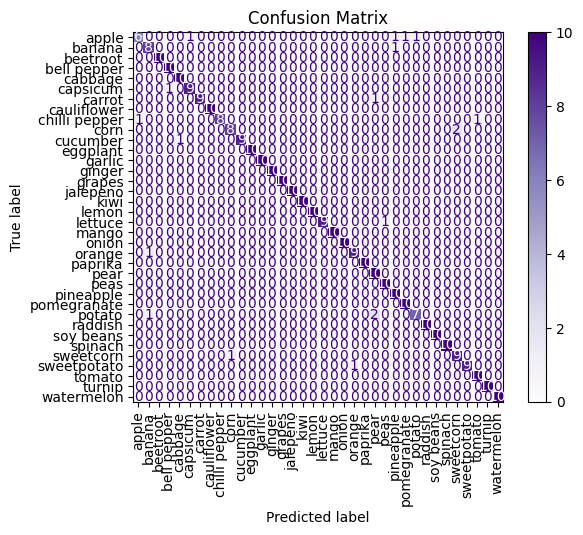

In [40]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Test verisinden resimler ve etiketler al
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(40, 40))
disp.plot(cmap="Purples", xticks_rotation=90, values_format='d')
plt.title("Confusion Matrix")
plt.show()
